In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import keras

from keras.models import load_model, Model

In [2]:
img_width = 100
img_height = 100

output_size = 512

In [3]:
def compute_loss(input_image, filter_index, feature_extractor):
    activation = feature_extractor(input_image)
    # We avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(img, filter_index, learning_rate, feature_extractor):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index, feature_extractor)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25

def visualize_filter(filter_index, feature_exctrator):
    # We run gradient ascent for 30 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate, feature_exctrator)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img

def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [4]:
def plt_filters(layer_name):
    
    layer = model.get_layer(layer_name)
    feature_extractor = Model(inputs=model.input, outputs=layer.output)
    
    n_feature = layer.output.shape[-1]
    n_cols = 8
    n_rows = n_feature // n_cols
    
    if n_feature == 32:
        plt.figure(figsize=(20, 10))
    elif n_feature == 16:
        plt.figure(figsize=(20, 5))
    elif n_feature == 64:
        plt.figure(figsize=(20, 20))
    plt.suptitle('Layer {}'.format(layer_name))
    
    for idx in range(n_feature):
        _, img = visualize_filter(idx, feature_extractor)
        img = cv2.resize(img, (output_size, output_size))
        plt.subplot(n_rows, n_cols, idx+1)
        plt.title('Filter {}'.format(idx+1))
        plt.axis('off')
        plt.imshow(img)
        
    plt.show()

In [5]:
model = load_model("saved_models/FCNNplus/")

In [6]:
for layer in model.layers:
    if 'conv' in layer.name:
        print("Layer name : {}".format(layer.name))

Layer name : conv1_block01
Layer name : conv2_block01
Layer name : conv3_block01
Layer name : conv1d_1
Layer name : conv1_block02
Layer name : conv2_block02
Layer name : conv3_block02
Layer name : conv1d_2


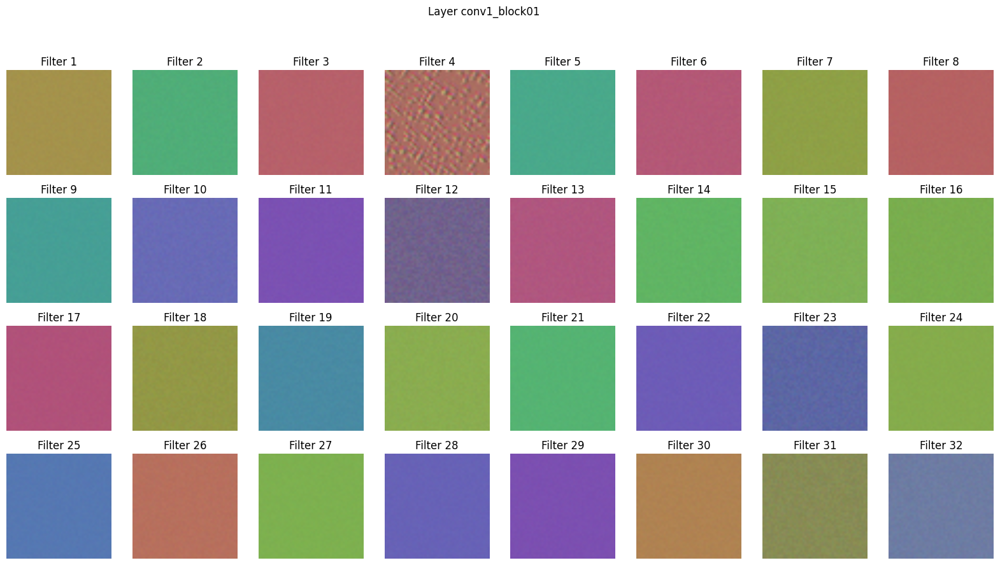

In [7]:
plt_filters('conv1_block01')

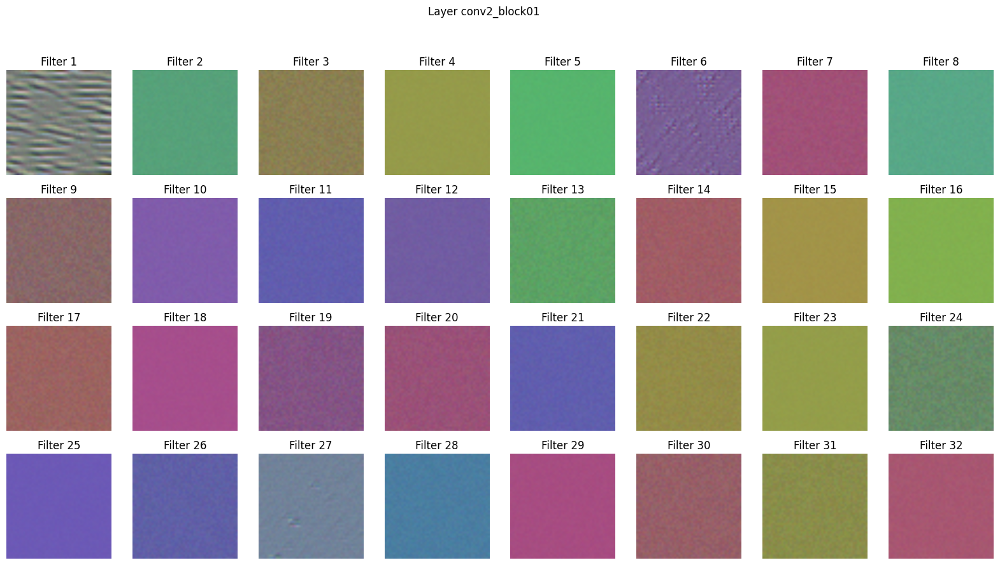

In [8]:
plt_filters("conv2_block01")

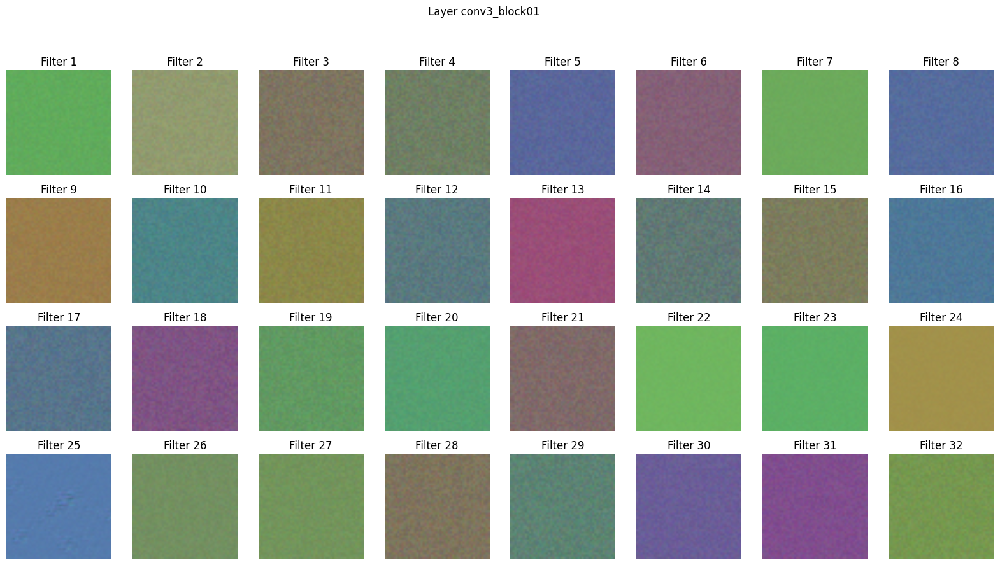

In [9]:
plt_filters("conv3_block01")

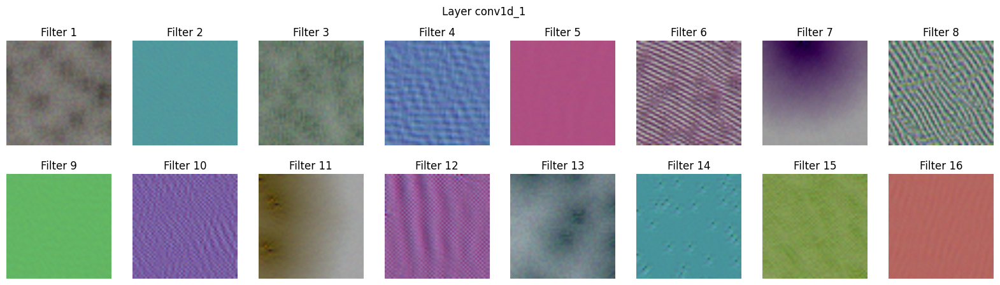

In [10]:
plt_filters("conv1d_1")

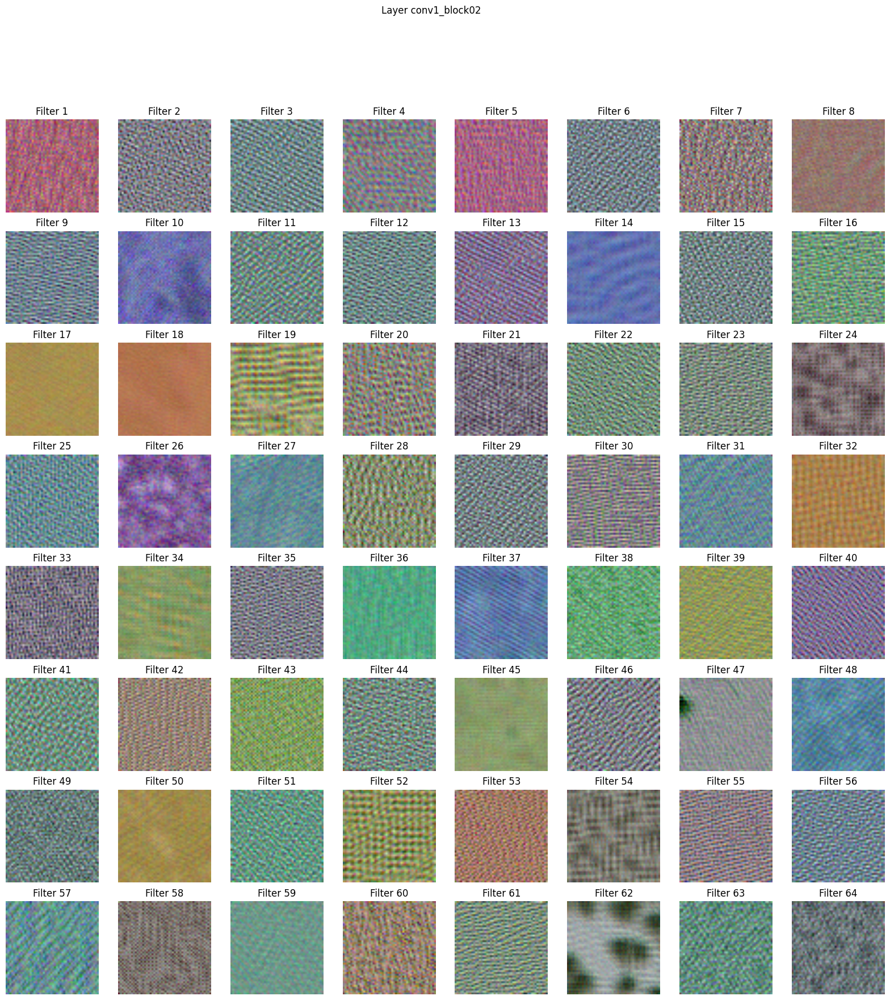

In [11]:
plt_filters('conv1_block02')

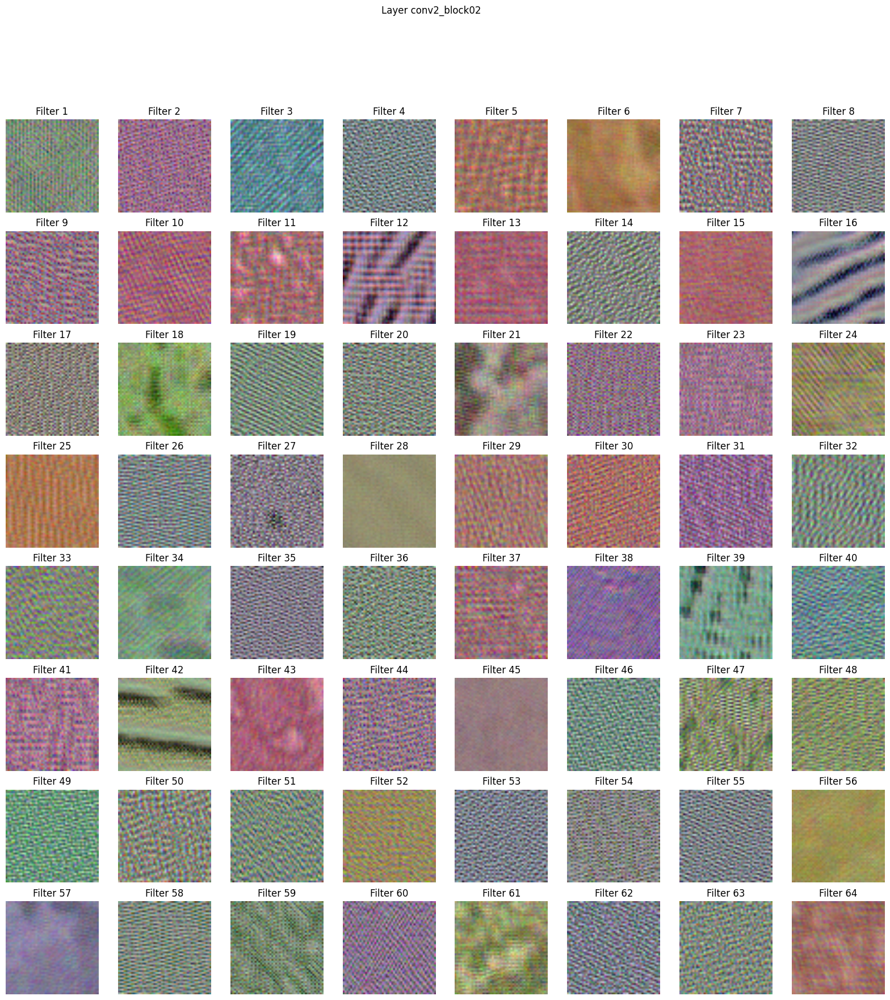

In [12]:
plt_filters("conv2_block02")

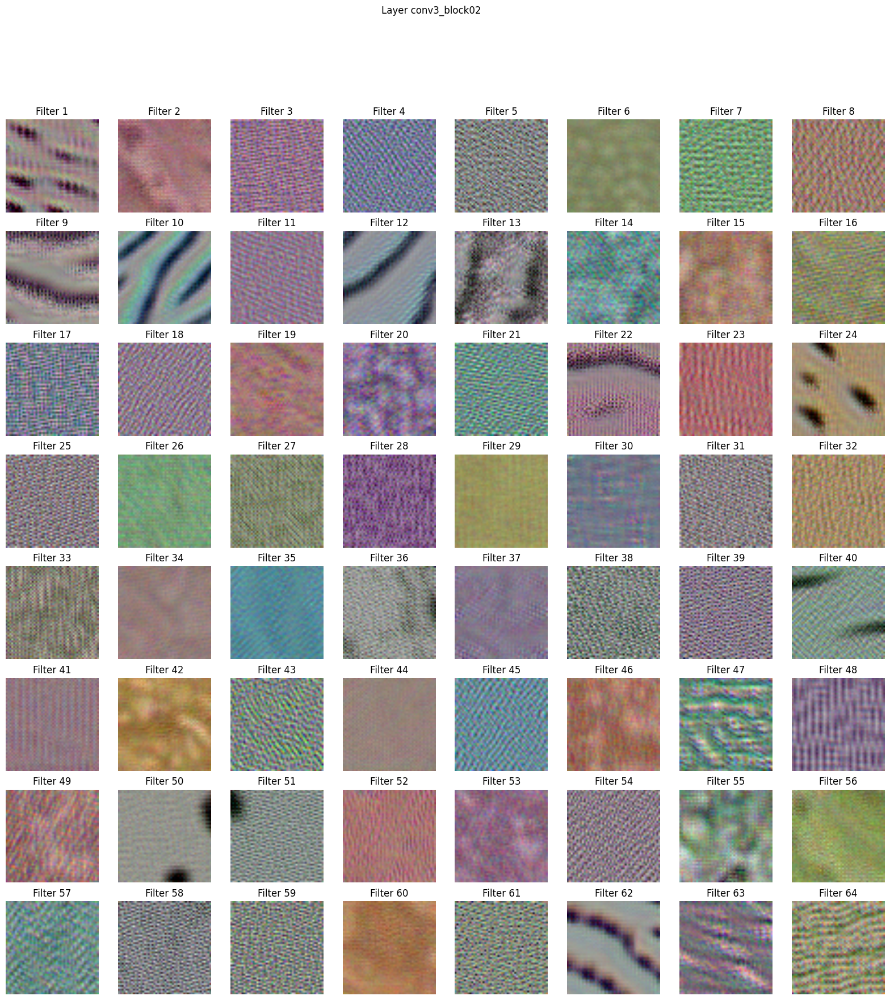

In [13]:
plt_filters("conv3_block02")

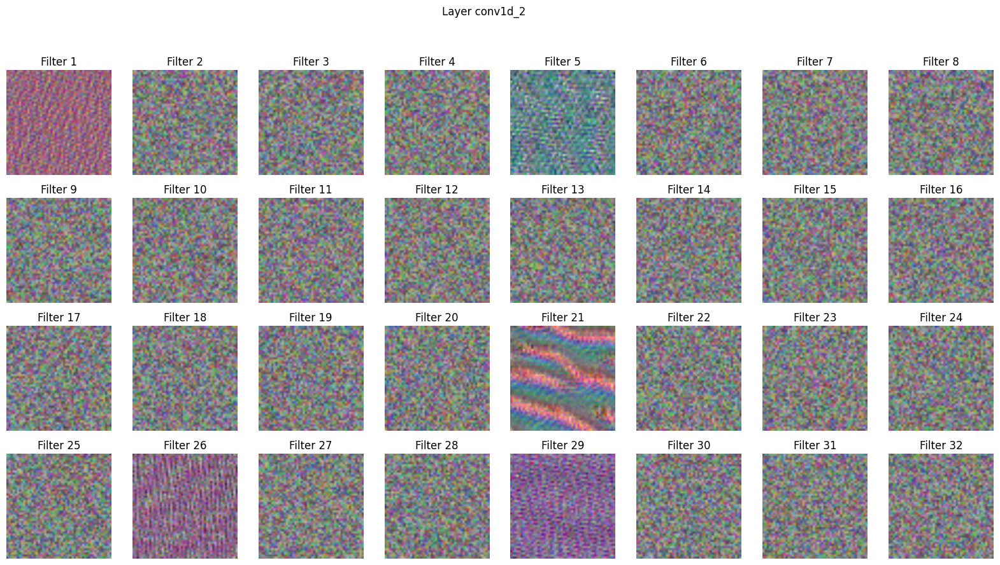

In [14]:
plt_filters("conv1d_2")